<a href="https://colab.research.google.com/github/banunkers/d7041e-labs/blob/master/d7041e_lab2_SOM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np
import numpy.matlib
from matplotlib import pyplot as plt
import math
import time

In [0]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [0]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [0]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [0]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [0]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [0]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]

    nrows = ndim
    ncols = ndim
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
    
        plt.show()
         
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;

        if t == math.floor(nepochs / 2):
            #print(t)
            if showMode >= 1:
                print("\n SOM features at 50% training")
                
                fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
                
                for k in range(nrows):
                    for l in range (ncols):
                        A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                        ax[k,l].imshow(A,cmap="plasma")
                        ax[k,l].set_yticks([])
                        ax[k,l].set_xticks([])   
            #
                plt.show()
         

                

    if showMode >= 1:
        print("\nSOM features AFTER training: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
        
        plt.show()
    return som
    

In [0]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        0: input_data.as_matrix([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16])
    }

    return input_database, labels, classes

In [10]:
input_filename = 'data/zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename,None)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  if __name__ == '__main__':



SOM features before training: 



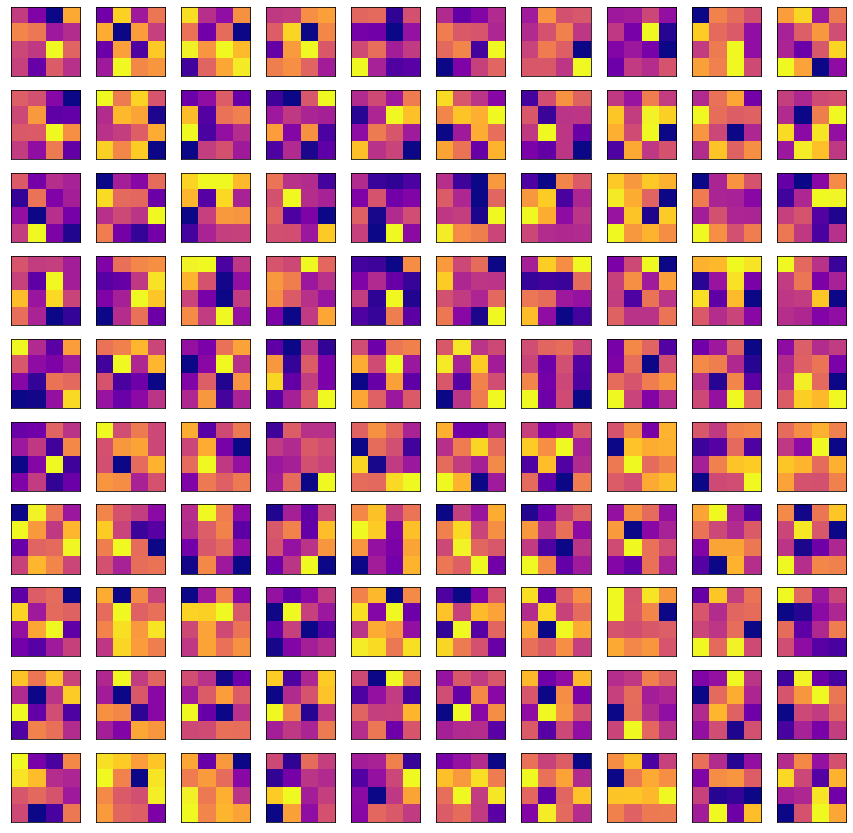


 SOM features at 50% training


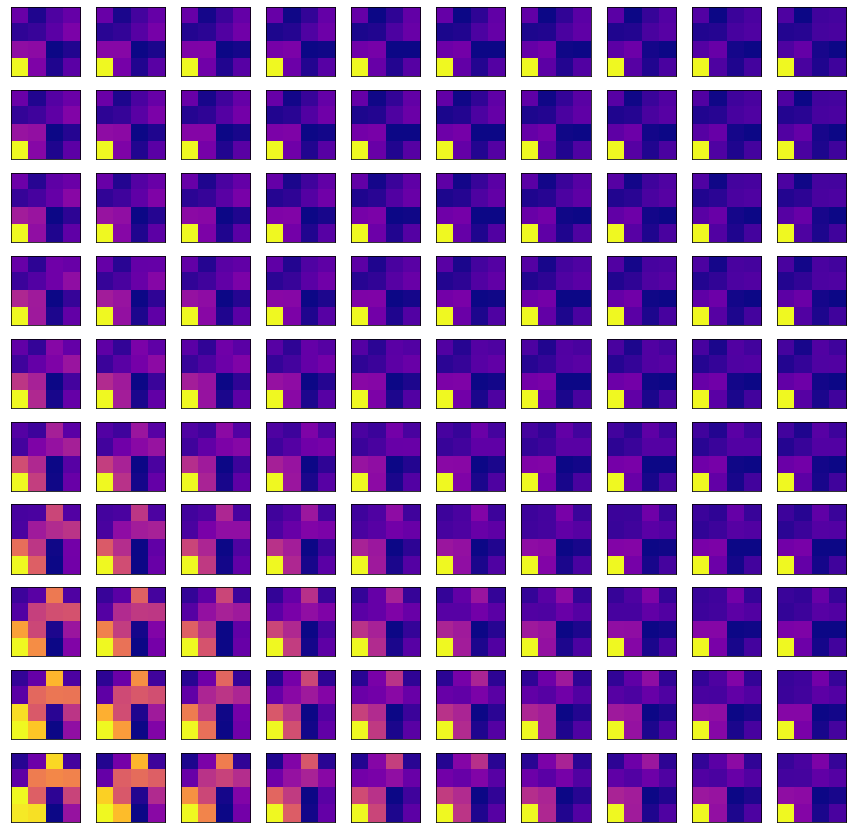


SOM features AFTER training: 



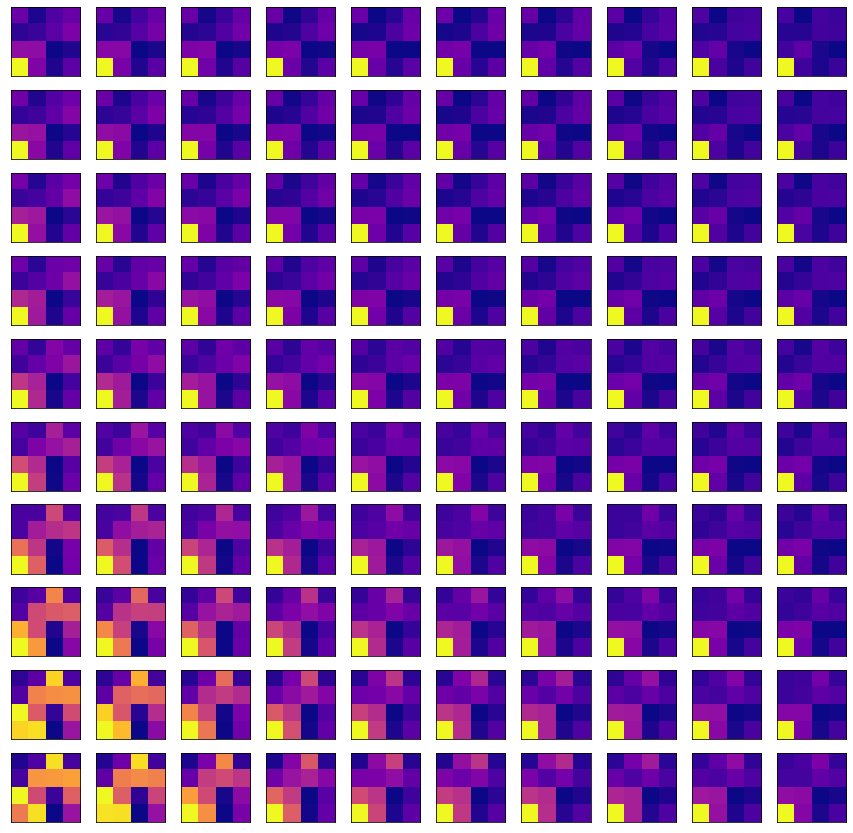

In [11]:
som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


In [0]:
#verification of correctness on the training set:



def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    



In [0]:
ndim=10
nrows=ndim
ncols=ndim
grid_color=np.zeros((nrows,ncols))
nclasses=np.max(classes)

Confusion_Matrix=np.zeros((nclasses,nclasses))
grid_color,Confusion_Matrix=SOM_Test (input_vector_database[0], som_trained, classes, grid_color, Confusion_Matrix, ndim)




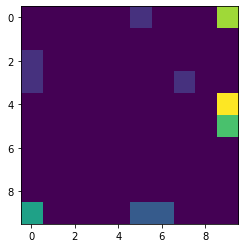

In [14]:
plt.close()
plt.imshow(grid_color)
plt.show()

In [15]:
Confusion_Matrix, input_vector_database[0].shape, np.sum(Confusion_Matrix)

(array([[38.,  0.,  0.,  3.,  0.,  0.,  0.],
        [ 0., 20.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  3.,  2.,  0.,  0.],
        [ 0.,  0.,  0., 13.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  4.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.,  8.,  0.],
        [ 0.,  0.,  0.,  4.,  0.,  5.,  1.]]), (101, 16), 101.0)

# 1.1 

In [16]:
from keras.datasets import mnist
import seaborn as sn


Using TensorFlow backend.


In [17]:
(training_data, training_labels), (test_data, test_labels)= mnist.load_data()
sample_amount = 100

training_data = training_data[:sample_amount,:,:]
training_labels = training_labels[:sample_amount]

test_data = test_data[:sample_amount,:,:]

training_data = training_data.reshape(
    sample_amount,
    training_data.shape[1] * training_data.shape[2]).astype(int)

test_data = test_data.reshape(
    sample_amount,
    test_data.shape[1] * test_data.shape[2]
).astype(int)

print(training_data.shape)
print(test_data.shape)

11493376/11490434 [==============================] - 0s 0us/step
(100, 784)
(100, 784)



SOM features before training: 



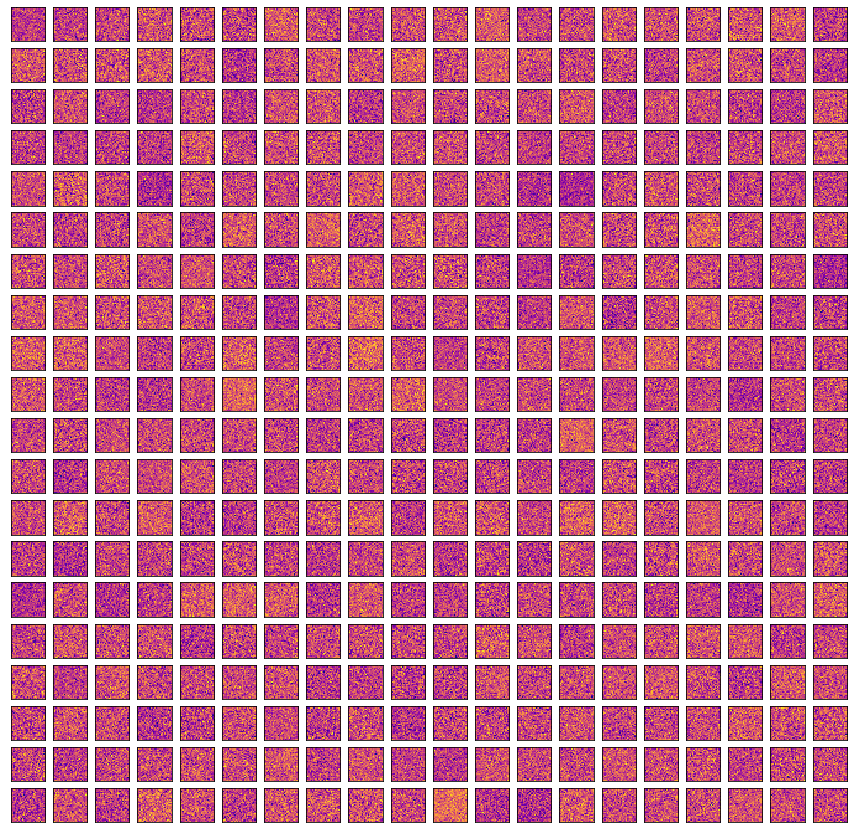


 SOM features at 50% training


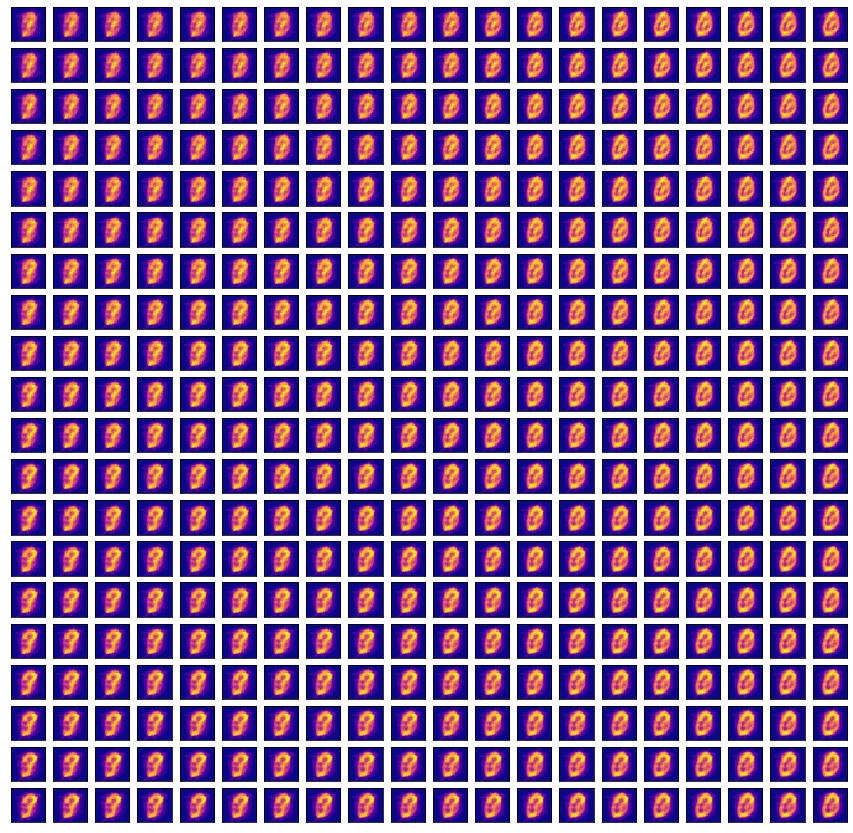


SOM features AFTER training: 



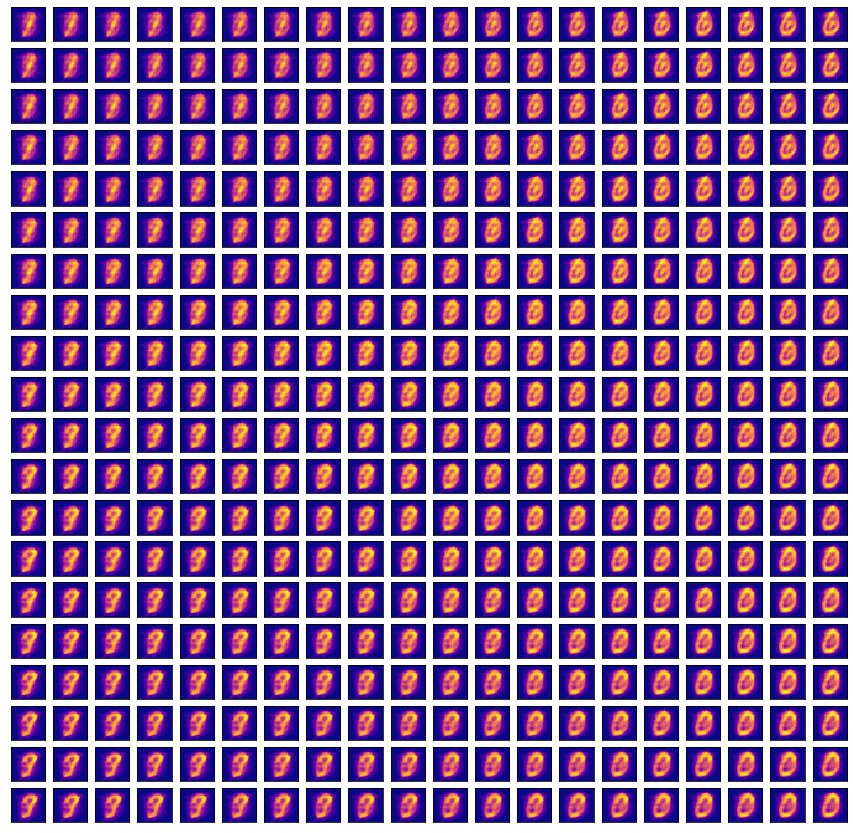

In [18]:
som_20_20 = SOM([28,28], training_data, showMode=1, ndim=20)


SOM features before training: 



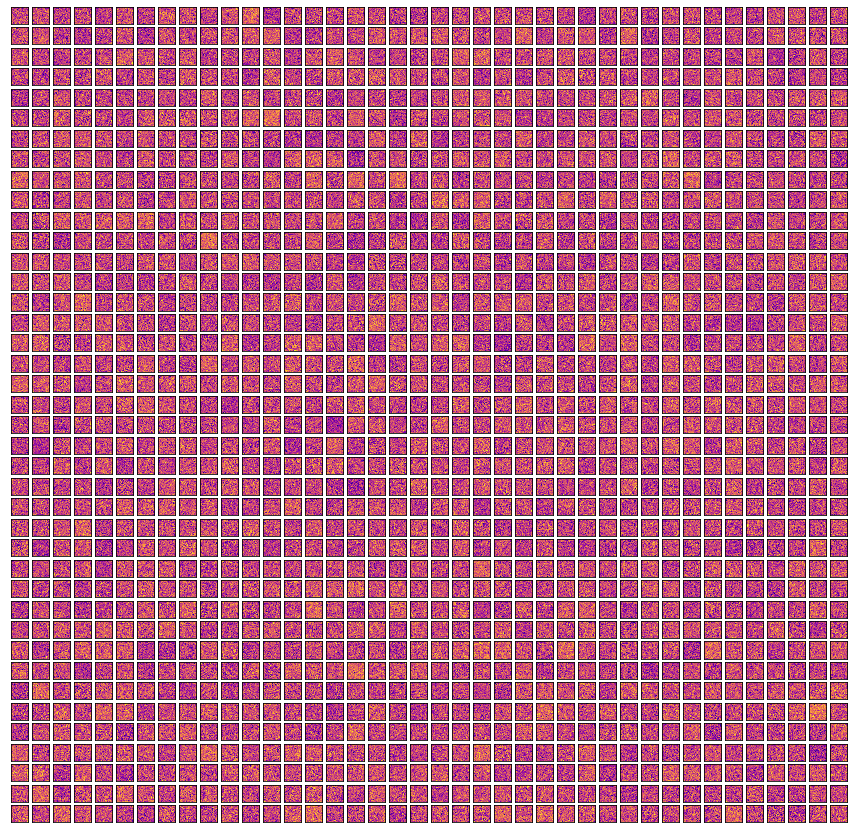


 SOM features at 50% training


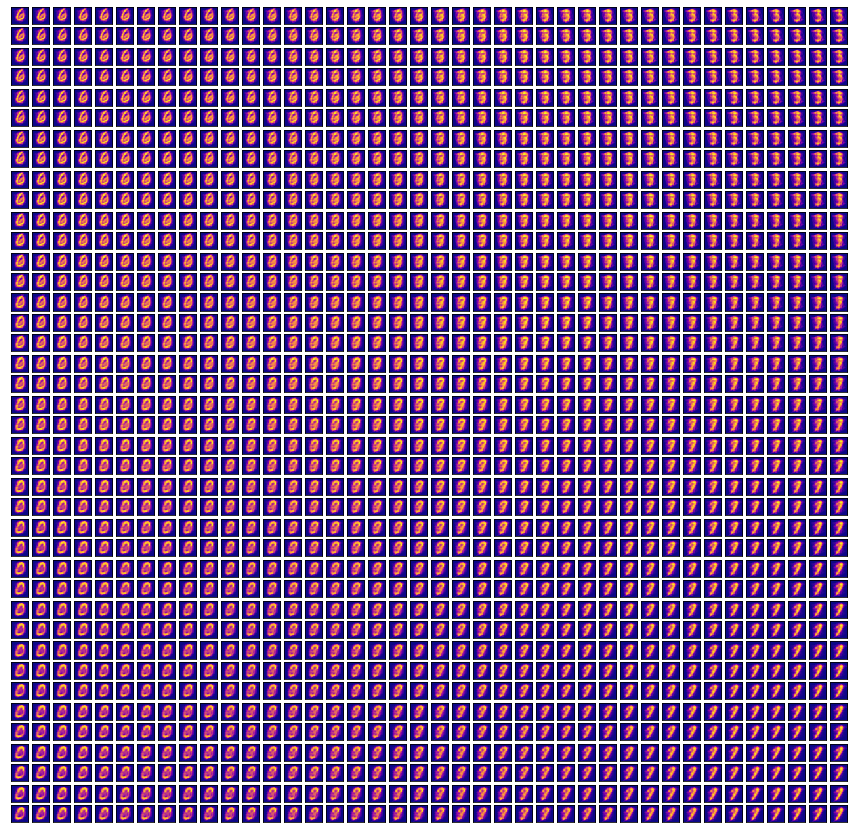


SOM features AFTER training: 



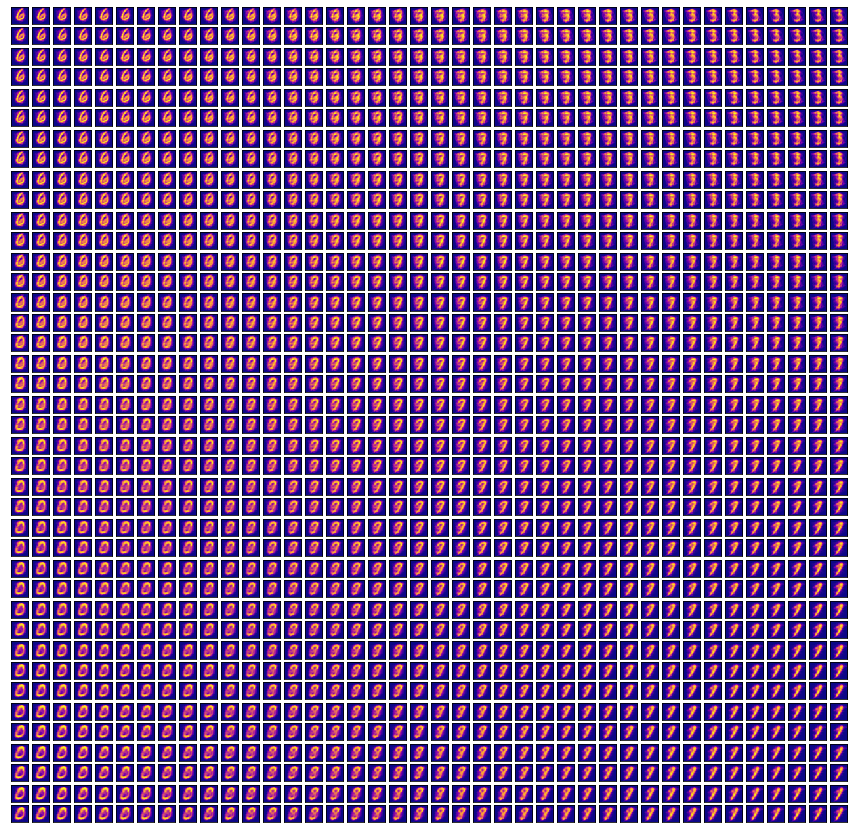

In [19]:
som_40_40 = SOM([28,28], training_data, showMode=1, ndim=40)


SOM features before training: 



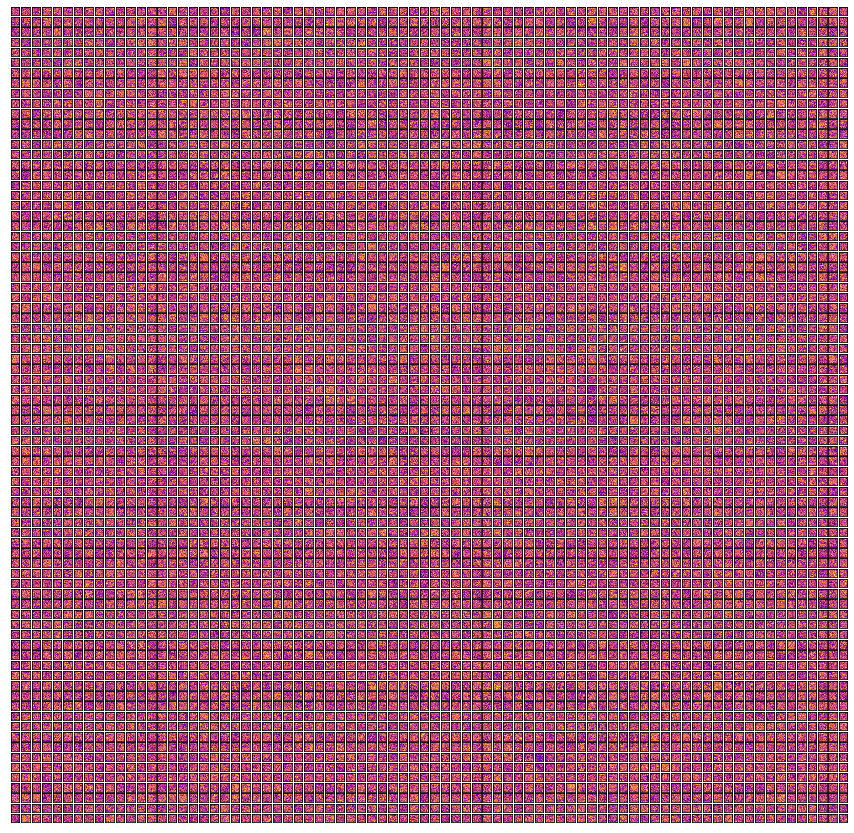


 SOM features at 50% training


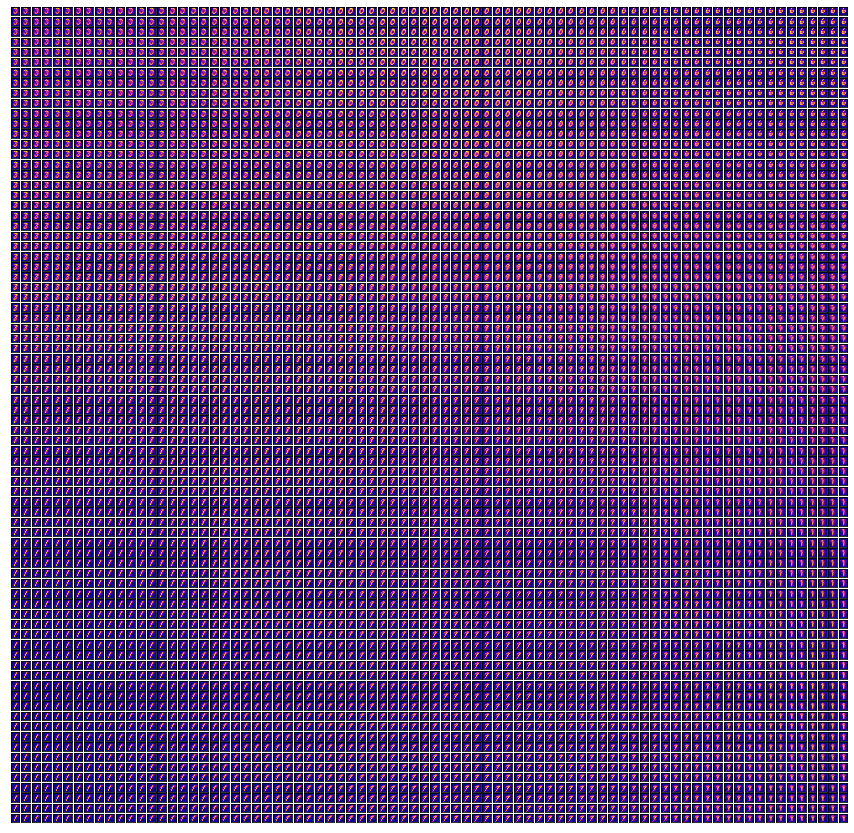


SOM features AFTER training: 



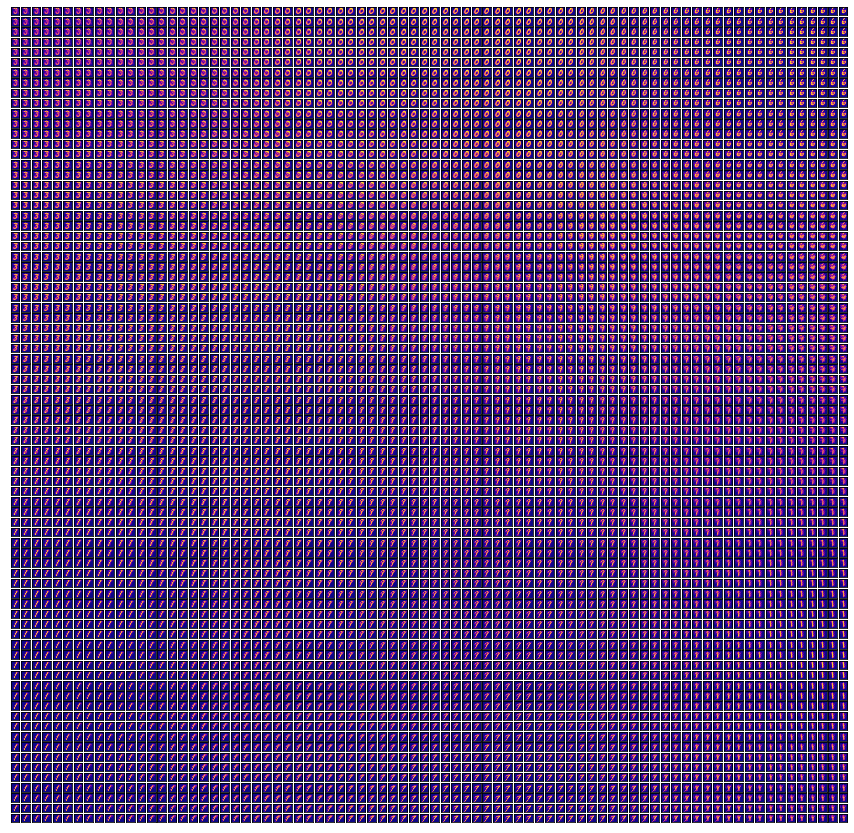

In [20]:
som_80_80 = SOM([28,28], training_data, showMode=1, ndim=80)

20x20 training accuracy: 0.76
20x20 test accuracy: 0.8
40x40 training accuracy: 0.94
40x40 test accuracy: 0.92
80x80 training accuracy: 0.99
80x80 test accuracy: 0.98


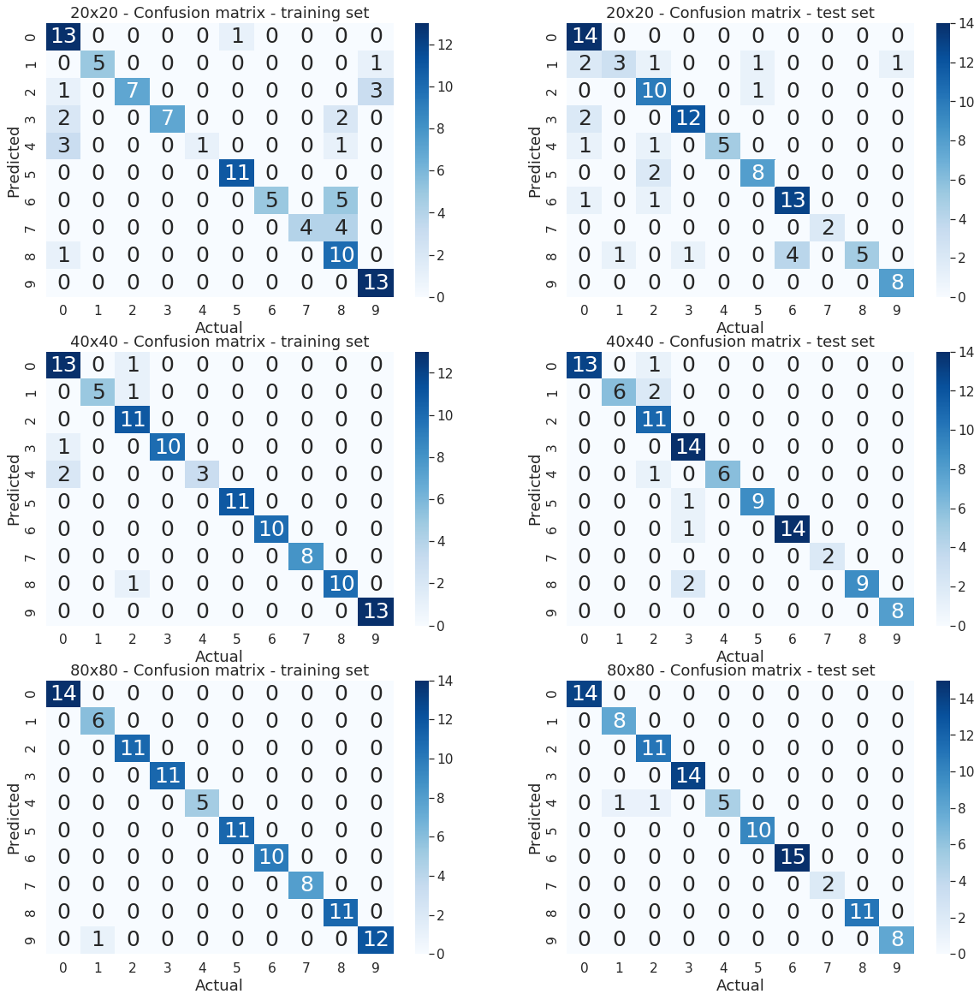

In [35]:
ndim = 20
grid_ = np.zeros((ndim, ndim))
confusion_matrix = np.zeros((10,10))


# Setup figures
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20,20))
ax0 = plt.subplot(3,2,1)
ax1 = plt.subplot(3,2,2)
ax2 = plt.subplot(3,2,3)
ax3 = plt.subplot(3,2,4)
ax4 = plt.subplot(3,2,5)
ax5 = plt.subplot(3,2,6)
sn.set(font_scale=1.4)


# Plot 20x20 training confusion matrix
grid_color, confusion_matrix = SOM_Test(training_data, som_20_20, training_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax0, cmap="Blues")
ax0.set_title("20x20 - Confusion matrix - training set", fontsize=18)
ax0.set_ylabel("Predicted", fontsize=18)
ax0.set_xlabel("Actual", fontsize=18)
print(f"20x20 training accuracy: {np.trace(confusion_matrix) / sample_amount}")

# Plot 20x20 test confusion matrix
confusion_matrix = np.zeros((10,10))
grid_color, confusion_matrix = SOM_Test(test_data, som_20_20, test_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax1, cmap="Blues")
ax1.set_title("20x20 - Confusion matrix - test set", fontsize=18)
ax1.set_ylabel("Predicted", fontsize=18)
ax1.set_xlabel("Actual", fontsize=18)
print(f"20x20 test accuracy: {np.trace(confusion_matrix) / sample_amount}")

ndim = 40
grid_ = np.zeros((ndim, ndim))

# Plot 40x40 training confusion matrix
confusion_matrix = np.zeros((10,10))
grid_color, confusion_matrix = SOM_Test(training_data, som_40_40, training_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax2, cmap="Blues")
ax2.set_title("40x40 - Confusion matrix - training set", fontsize=18)
ax2.set_ylabel("Predicted", fontsize=18)
ax2.set_xlabel("Actual", fontsize=18)
print(f"40x40 training accuracy: {np.trace(confusion_matrix) / sample_amount}")

# Plot 40x40 test confusion matrix
confusion_matrix = np.zeros((10,10))
grid_color, confusion_matrix = SOM_Test(test_data, som_40_40, test_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax3, cmap="Blues")
ax3.set_title("40x40 - Confusion matrix - test set", fontsize=18)
ax3.set_ylabel("Predicted", fontsize=18)
ax3.set_xlabel("Actual", fontsize=18)
print(f"40x40 test accuracy: {np.trace(confusion_matrix) / sample_amount}")

ndim = 80
grid_ = np.zeros((ndim, ndim))

# Plot 40x40 training confusion matrix
confusion_matrix = np.zeros((10,10))
grid_color, confusion_matrix = SOM_Test(training_data, som_80_80, training_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax4, cmap="Blues")
ax4.set_title("80x80 - Confusion matrix - training set", fontsize=18)
ax4.set_ylabel("Predicted", fontsize=18)
ax4.set_xlabel("Actual", fontsize=18)
print(f"80x80 training accuracy: {np.trace(confusion_matrix) / sample_amount}")

# Plot 40x40 test confusion matrix
confusion_matrix = np.zeros((10,10))
grid_color, confusion_matrix = SOM_Test(test_data, som_80_80, test_labels, grid_, confusion_matrix, ndim)
sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 25}, ax=ax5, cmap="Blues")
ax5.set_title("80x80 - Confusion matrix - test set", fontsize=18)
ax5.set_ylabel("Predicted", fontsize=18)
ax5.set_xlabel("Actual", fontsize=18)
print(f"80x80 test accuracy: {np.trace(confusion_matrix) / sample_amount}")

In [22]:
for i in np.linspace(0,0.3,21):
    som_eta = SOM([28,28], training_data, showMode=0, ndim=20, etadecay=i)
    ndim = 20
    grid_ = np.zeros((ndim, ndim))
    confusion_matrix = np.zeros((10,10))

    grid_color, confusion_matrix = SOM_Test(test_data, som_eta, test_labels, grid_, confusion_matrix, ndim)
    print(f"{i} {np.trace(confusion_matrix)}")

# Best etadecay is 0.15

0.0 79.0
0.015 80.0
0.03 80.0
0.045 74.0
0.06 65.0
0.075 80.0
0.09 83.0
0.105 83.0
0.12 64.0
0.135 82.0
0.15 82.0
0.16499999999999998 69.0
0.18 79.0
0.195 61.0
0.21 81.0
0.22499999999999998 66.0
0.24 79.0
0.255 59.0
0.27 62.0
0.285 62.0
0.3 67.0


In [37]:
for i in np.linspace(0,1,21):
    som_eta = SOM([28,28], training_data, showMode=0, ndim=20, etadecay=0.15, sgmdecay=i)
    ndim = 20
    grid_ = np.zeros((ndim, ndim))
    confusion_matrix = np.zeros((10,10))

    grid_color, confusion_matrix = SOM_Test(test_data, som_eta, test_labels, grid_, confusion_matrix, ndim)
    print(f"{i} {np.trace(confusion_matrix)}")

# The best sgmdecay is 0.4

0.0 55.0
0.05 62.0
0.1 90.0
0.15000000000000002 89.0
0.2 89.0
0.25 93.0
0.30000000000000004 94.0
0.35000000000000003 92.0
0.4 94.0
0.45 90.0
0.5 94.0
0.55 92.0
0.6000000000000001 91.0
0.65 92.0
0.7000000000000001 93.0
0.75 88.0
0.8 89.0
0.8500000000000001 86.0
0.9 87.0
0.9500000000000001 91.0
1.0 87.0
